In [1]:
import keras
import tensorflow as tf
import gdal
import os
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
from keras_unet.models import custom_unet, satellite_unet
from keras_unet.metrics import iou, iou_thresholded
from keras_unet.losses import jaccard_distance
from keras_unet.utils import plot_segm_history

-----------------------------------------
keras-unet init: TF version is >= 2.0.0 - using `tf.keras` instead of `Keras`
-----------------------------------------


In [2]:
base_dir = Path(r'/media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training_strat')
mask_dir = base_dir.joinpath('masks_img')
image_dir = base_dir.joinpath('img')
water_dir = mask_dir.joinpath('water')
shrubs_dir = mask_dir.joinpath('shrub')
trees_dir = mask_dir.joinpath('tree')
low_dir = mask_dir.joinpath('low')

In [3]:
def make_path(img_dir, prefix, number):
    return os.path.join(img_dir, f"{prefix}_{number}.tif")

In [4]:
def make_path_tile(img_dir, prefix, number):
    return os.path.join(img_dir, f"{prefix}{number}.tif")

In [5]:
def img_number(fpath: str) -> int:
    return int(os.path.splitext(os.path.split(fpath)[1])[0].split('_')[-1])

In [6]:
def load_image(path: str) -> np.ndarray:
    ds = gdal.Open(path, gdal.GA_ReadOnly)
    return ds.GetRasterBand(1).ReadAsArray()

In [7]:
def load_stack(shape, dtype, img_dir, prefix):
    stack = np.zeros(shape = shape, dtype = dtype)
    for i in range(shape[0]):
        image_path = make_path(img_dir, prefix, i + 1)
        stack[i, :, :] = load_image(image_path)
    return stack

def load_stack_safely(shape, dtype, img_dir, prefix):
    stack = np.zeros(shape = shape, dtype = dtype)
    for i in range(shape[0]):
        image_path = make_path(img_dir, prefix, i + 1)
        if not os.path.isfile(image_path):
            print("skipping", image_path)
            continue
        stack[i, :, :] = load_image(image_path)
    return stack

In [16]:
I = 245
N = 256
M = 256
V = 4

In [17]:
train_images = load_stack((I, N, M), np.float32, image_dir, "img")
train_images_R = train_images.reshape(I, N, M, 1)

In [18]:
train_images_R.shape

(245, 256, 256, 1)

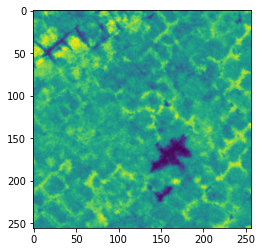

In [19]:
plt.imshow(train_images[1, :,:])

In [20]:
water_mask = load_stack_safely((I, N, M), np.int8, water_dir, "water")
trees_mask = load_stack_safely((I, N, M), np.int8, trees_dir, "tree")
shrubs_mask = load_stack_safely((I, N, M), np.int8, shrubs_dir, "shrub")
low_mask = load_stack_safely((I, N, M), np.int8, low_dir, "low")

skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training_strat/masks_img/water/water_4.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training_strat/masks_img/water/water_15.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training_strat/masks_img/water/water_23.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training_strat/masks_img/water/water_24.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training_strat/masks_img/water/water_26.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training_strat/masks_img/water/water_30.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training_strat/masks_img/water/water_36.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training_strat/masks_img/water/water_37.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training_strat/masks_img/wat

skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training_strat/masks_img/shrub/shrub_38.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training_strat/masks_img/shrub/shrub_39.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training_strat/masks_img/shrub/shrub_41.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training_strat/masks_img/shrub/shrub_42.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training_strat/masks_img/shrub/shrub_43.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training_strat/masks_img/shrub/shrub_44.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training_strat/masks_img/shrub/shrub_45.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training_strat/masks_img/shrub/shrub_49.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training_strat/masks_img/sh

skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training_strat/masks_img/low/low_47.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training_strat/masks_img/low/low_48.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training_strat/masks_img/low/low_49.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training_strat/masks_img/low/low_50.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training_strat/masks_img/low/low_51.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training_strat/masks_img/low/low_52.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training_strat/masks_img/low/low_53.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training_strat/masks_img/low/low_55.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/u_net71e/training_strat/masks_img/low/low_56.tif
skipping /media/hkr

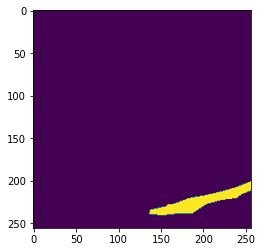

In [21]:
plt.imshow(low_mask[53, :,:])

In [22]:
water_mask[183,:,:]

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]], dtype=int8)

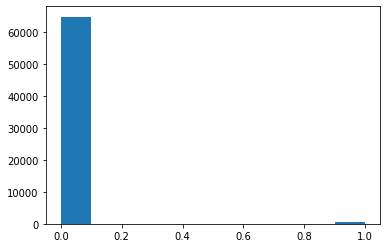

In [23]:
plt.hist(water_mask[0, :,:].flatten())
plt.show()

In [24]:
# divide data
W = 220
Y = np.zeros(shape=(W, N, M, V), dtype =np.int8)
Y_train_img = np.zeros(shape=(W, N, M, 1), dtype =np.float32)

Y[0:174, :, :, 0] = trees_mask[0:174, :, :]
Y[0:174, :, :, 1] = water_mask[0:174, :, :]
Y[0:174, :, :, 2] = shrubs_mask[0:174, :, :]
Y[0:174, :, :, 3] = low_mask[0:174, :, :]
Y_train_img[0:174, :, :, 0] = train_images_R[0:174, :, :, 0]

Y[175:220, :, :, 0] = trees_mask[200:245, :, :]
Y[175:220, :, :, 1] = water_mask[200:245, :, :]
Y[175:220, :, :, 2] = shrubs_mask[200:245, :, :]
Y[175:220, :, :, 3] = low_mask[200:245, :, :]
Y_train_img[175:225, :, :, 0] = train_images_R[200:245, :, :, 0]


K = 25
Y_valid = np.zeros(shape=(K, N, M, V), dtype =np.int8)
Y_valid_img = np.zeros(shape=(K, N, M, 1), dtype =np.float32)

Y_valid[0:25, :, :, 0] = trees_mask[175:200, :, :]
Y_valid[0:25, :, :, 1] = water_mask[175:200, :, :]
Y_valid[0:25, :, :, 2] = shrubs_mask[175:200, :, :]
Y_valid[0:25, :, :, 3] = low_mask[175:200, :, :]
Y_valid_img[0:25, :, :, 0] = train_images_R[175:200, :, :, 0]

In [25]:
# alter unet code from package
from keras_unet import TF
if TF:
    from tensorflow.keras.models import Model
    from tensorflow.keras.layers import ( 
        BatchNormalization, Conv2D, Conv2DTranspose,
        MaxPooling2D, UpSampling2D, Input,
        concatenate
    )
else:    
    from keras.models import Model
    from keras.layers import ( 
        BatchNormalization, Conv2D, Conv2DTranspose,
        MaxPooling2D, UpSampling2D, Input,
        concatenate
    )


def bn_conv_relu(input, filters, bachnorm_momentum, **conv2d_args):
    x = BatchNormalization(momentum=bachnorm_momentum)(input)
    x = Conv2D(filters, **conv2d_args)(x)
    return x

def bn_upconv_relu(input, filters, bachnorm_momentum, **conv2d_trans_args):
    x = BatchNormalization(momentum=bachnorm_momentum)(input)
    x = Conv2DTranspose(filters, **conv2d_trans_args)(x)
    return x

def satellite_unet2(
    input_shape,
    num_classes=1,
    output_activation='sigmoid',
    num_layers=4):

    inputs = Input(input_shape)   
    
    filters = 64
    upconv_filters = 96

    kernel_size = (5,5)
    activation = 'relu'
    strides = (1,1)
    padding = 'same'
    kernel_initializer = 'he_normal'

    conv2d_args = {
        'kernel_size':kernel_size,
        'activation':activation, 
        'strides':strides,
        'padding':padding,
        'kernel_initializer':kernel_initializer
        }

    conv2d_trans_args = {
        'kernel_size':kernel_size,
        'activation':activation, 
        'strides':(2,2),
        'padding':padding,
        'output_padding':(1,1)
        }

    bachnorm_momentum = 0.01

    pool_size = (2,2)
    pool_strides = (2,2)
    pool_padding = 'valid'

    maxpool2d_args = {
        'pool_size':pool_size,
        'strides':pool_strides,
        'padding':pool_padding,
        }
    
    x = Conv2D(filters, **conv2d_args)(inputs)
    c1 = bn_conv_relu(x, filters, bachnorm_momentum, **conv2d_args)    
    x = bn_conv_relu(c1, filters, bachnorm_momentum, **conv2d_args)
    x = MaxPooling2D(**maxpool2d_args)(x)

    down_layers = []

    for l in range(num_layers):
        x = bn_conv_relu(x, filters, bachnorm_momentum, **conv2d_args)
        x = bn_conv_relu(x, filters, bachnorm_momentum, **conv2d_args)
        down_layers.append(x)
        x = bn_conv_relu(x, filters, bachnorm_momentum, **conv2d_args)
        x = MaxPooling2D(**maxpool2d_args)(x)

    x = bn_conv_relu(x, filters, bachnorm_momentum, **conv2d_args)
    x = bn_conv_relu(x, filters, bachnorm_momentum, **conv2d_args)
    x = bn_upconv_relu(x, filters, bachnorm_momentum, **conv2d_trans_args)

    for conv in reversed(down_layers):        
        x = concatenate([x, conv])  
        x = bn_conv_relu(x, upconv_filters, bachnorm_momentum, **conv2d_args)
        x = bn_conv_relu(x, filters, bachnorm_momentum, **conv2d_args)
        x = bn_upconv_relu(x, filters, bachnorm_momentum, **conv2d_trans_args)

    x = concatenate([x, c1])
    x = bn_conv_relu(x, upconv_filters, bachnorm_momentum, **conv2d_args)
    x = bn_conv_relu(x, filters, bachnorm_momentum, **conv2d_args)
           
    outputs = Conv2D(num_classes, kernel_size=(1,1), strides=(1,1), activation=output_activation, padding='valid') (x)       
    
    model = Model(inputs=[inputs], outputs=[outputs])
    return model

In [26]:
model = satellite_unet2((N, M, 1), V)

In [27]:
model.compile(
    optimizer = tf.keras.optimizers.Adam(),
    loss = "binary_crossentropy",
    metrics = [iou, iou_thresholded],
)

In [ ]:
history = model.fit(Y_train_img, Y, epochs = 50)

Epoch 1/50
7/7 [==============================] - 167s 21s/step - loss: 0.5045 - iou: 0.2105 - iou_thresholded: 0.2672
Epoch 2/50
7/7 [==============================] - 159s 23s/step - loss: 0.2638 - iou: 0.3145 - iou_thresholded: 0.3799
Epoch 3/50
7/7 [==============================] - 157s 22s/step - loss: 0.1999 - iou: 0.4095 - iou_thresholded: 0.4942
Epoch 4/50
7/7 [==============================] - 153s 22s/step - loss: 0.1747 - iou: 0.4371 - iou_thresholded: 0.5182
Epoch 5/50
7/7 [==============================] - 157s 22s/step - loss: 0.1674 - iou: 0.4838 - iou_thresholded: 0.5550
Epoch 6/50
7/7 [==============================] - 157s 22s/step - loss: 0.1511 - iou: 0.5027 - iou_thresholded: 0.5917
Epoch 7/50
7/7 [==============================] - 153s 22s/step - loss: 0.1436 - iou: 0.4950 - iou_thresholded: 0.5975
Epoch 8/50
7/7 [==============================] - 154s 22s/step - loss: 0.1532 - iou: 0.5217 - iou_thresholded: 0.6118
Epoch 9/50
7/7 [==============================] 

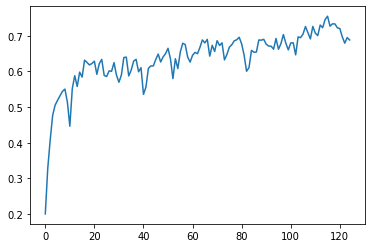

In [30]:
plt.plot(history.history['iou'])

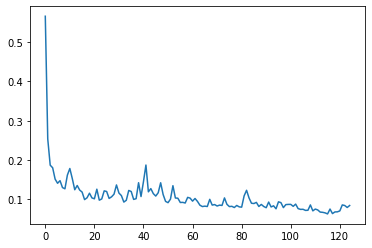

In [31]:
plt.plot(history.history['loss'])

In [32]:
modelsave_path = Path(r'/media/hkropp/research/Kolyma_Data/training/model/1971_strat_k5')

In [33]:
model.save(modelsave_path)

INFO:tensorflow:Assets written to: /media/hkropp/research/Kolyma_Data/training/model/1971_k5/assets


INFO:tensorflow:Assets written to: /media/hkropp/research/Kolyma_Data/training/model/1971_k5/assets


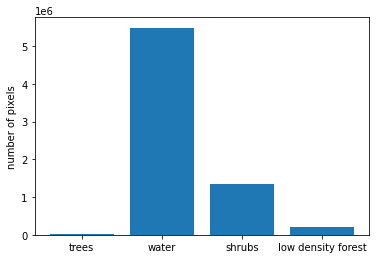

In [34]:
fig, ax = plt.subplots()
ax.bar(range(V), [trees_mask.sum(), water_mask.sum(), shrubs_mask.sum(), low_mask.sum()])
ax.set_xticks((0, 1, 2, 3))
ax.set_xticklabels(('trees', 'water', 'shrubs', 'low density forest'))
plt.ylabel('number of pixels')
plt.show()

In [35]:
Y_pred = model.predict(Y_train_img)

6/6 [==============================] - 20s 3s/step


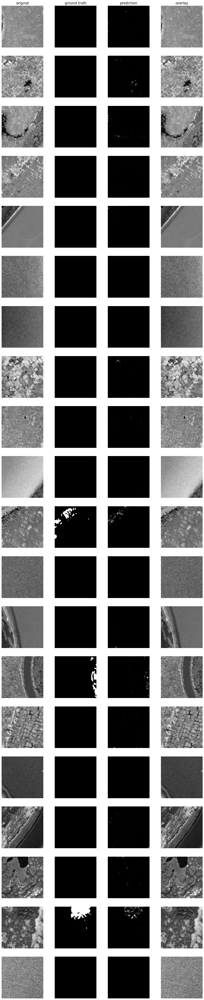

In [36]:
from keras_unet.utils import plot_imgs

# Trees
plot_imgs(
    org_imgs=Y_train_img, 
    mask_imgs=Y[:, :, :, 0], 
    pred_imgs=Y_pred[:, :, :, 0], 
    nm_img_to_plot=20
  )

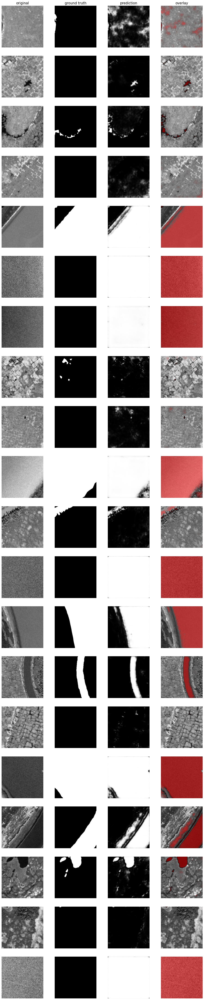

In [37]:
# Water
plot_imgs(
    org_imgs=Y_train_img, 
    mask_imgs=Y[:, :, :, 1], 
    pred_imgs=Y_pred[:, :, :, 1], 
    nm_img_to_plot=20
  )

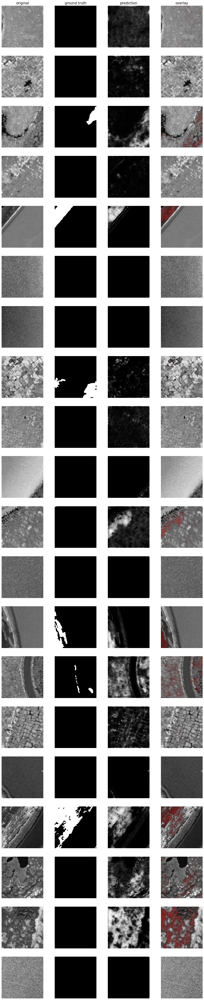

In [38]:
# Shrubs
plot_imgs(
    org_imgs=Y_train_img, 
    mask_imgs=Y[:, :, :, 2], 
    pred_imgs=Y_pred[:, :, :, 2], 
    nm_img_to_plot=20
  )

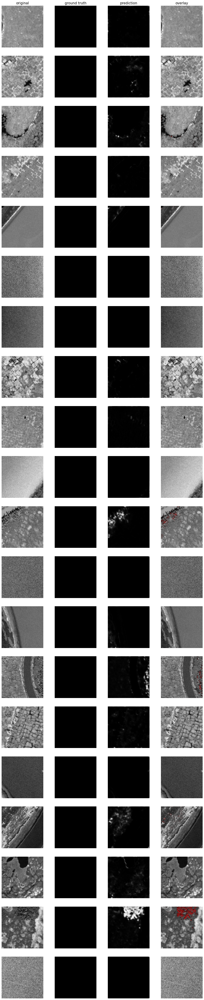

In [39]:
# Low density forest
plot_imgs(
    org_imgs=Y_train_img, 
    mask_imgs=Y[:, :, :, 3], 
    pred_imgs=Y_pred[:, :, :, 3], 
    nm_img_to_plot=20
  )

In [41]:
valid_pred = model.predict(Y_valid_img)

1/1 [==============================] - 3s 3s/step


In [42]:
valid_pred[1,:, :, 0]

array([[6.4122863e-03, 5.3500086e-03, 7.0973334e-04, ..., 7.2866767e-03,
        2.2239711e-02, 3.7684415e-02],
       [2.2723910e-03, 7.6249446e-04, 6.9781883e-05, ..., 4.4311774e-03,
        6.4735846e-03, 1.0948631e-02],
       [5.4076797e-04, 1.3992490e-04, 1.1139633e-05, ..., 8.5122121e-04,
        1.5626232e-03, 7.7015483e-03],
       ...,
       [2.4760159e-04, 1.2746679e-04, 5.6997760e-06, ..., 5.9361674e-04,
        1.3078905e-03, 4.6892120e-03],
       [5.0729746e-04, 2.7115748e-04, 1.9194831e-05, ..., 9.0604770e-04,
        1.2908721e-03, 1.0321497e-02],
       [2.0460910e-03, 1.2178551e-03, 1.3687233e-04, ..., 2.0193146e-03,
        5.2380092e-03, 1.8528055e-02]], dtype=float32)

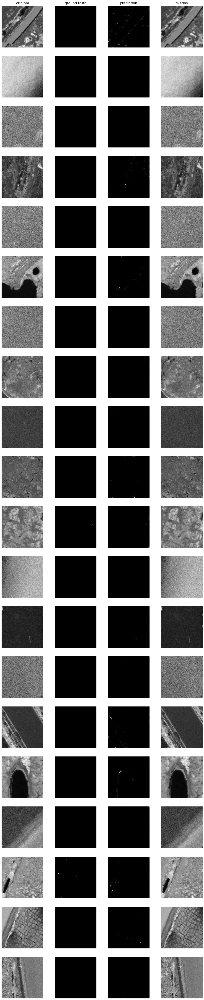

In [43]:
# Trees
plot_imgs(
    org_imgs=Y_valid_img, 
    mask_imgs=Y_valid[:, :, :, 0], 
    pred_imgs=valid_pred[:, :, :, 0], 
    nm_img_to_plot=20
  )

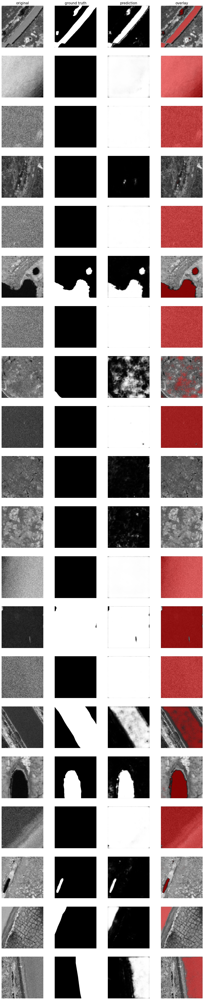

In [44]:
# Water
plot_imgs(
    org_imgs=Y_valid_img, 
    mask_imgs=Y_valid[:, :, :, 1], 
    pred_imgs=valid_pred[:, :, :, 1], 
    nm_img_to_plot=20
  )

In [45]:
waterPredict = valid_pred[:,:,:,1]

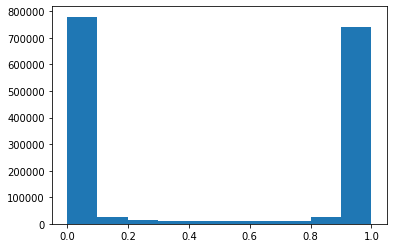

In [46]:
plt.hist(waterPredict.flatten())
plt.show()

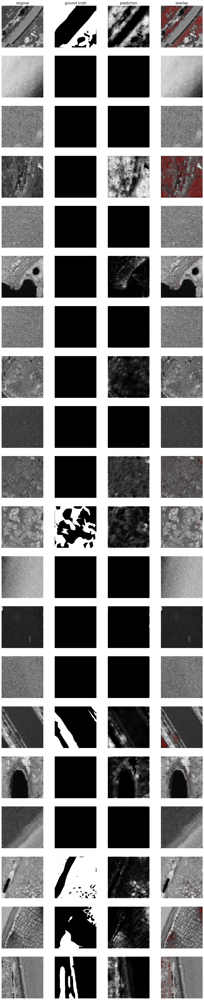

In [47]:
# Shrubs
plot_imgs(
    org_imgs=Y_valid_img, 
    mask_imgs=Y_valid[:, :, :, 2], 
    pred_imgs=valid_pred[:, :, :, 2], 
    nm_img_to_plot=20
  )

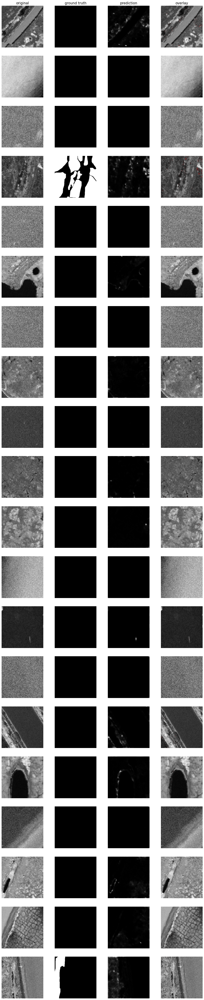

In [48]:
# Low density forest
plot_imgs(
    org_imgs=Y_valid_img, 
    mask_imgs=Y_valid[:, :, :, 3], 
    pred_imgs=valid_pred[:, :, :, 3], 
    nm_img_to_plot=20
  )

In [49]:
Y_valid[0,0,0,0]

0

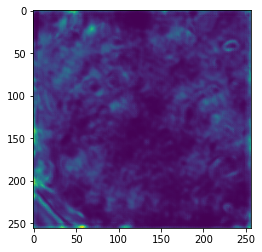

In [50]:
plt.imshow(valid_pred[7,:, :,2])

In [51]:
driver = gdal.GetDriverByName("GTiff")

In [52]:
driver.Register()

2

In [53]:
def save_predict_validT( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(0,25):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 176) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTree = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTree.SetGeoTransform(gt)
        outTree.SetProjection(pt)
        outBandTree = outTree.GetRasterBand(1)
        outBandTree.WriteArray(valid_pred[i,:,:,0])
        outBandTree.SetNoDataValue(np.nan)
        outBandTree.FlushCache()
        outBandTree = None
        outTree = None

In [54]:
tree_valid_dir = r'/media/hkropp/research/Kolyma_Data/training/eval/1971_strat_k5/tree'
save_predict_validT(nImg = 25,xdim= 256, ydim= 256,img_dir = tree_valid_dir,prefix = "tree_predict",orig_dir = image_dir , prefix_orig = "img")

In [55]:
def save_predict_validW( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(0,25):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 176) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTree = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTree.SetGeoTransform(gt)
        outTree.SetProjection(pt)
        outBandTree = outTree.GetRasterBand(1)
        outBandTree.WriteArray(valid_pred[i,:,:,1])
        outBandTree.SetNoDataValue(np.nan)
        outBandTree.FlushCache()
        outBandTree = None
        outTree = None

In [56]:
water_valid_dir = r'/media/hkropp/research/Kolyma_Data/training/eval/1971_strat_k5/water'
save_predict_validW(nImg = 25,xdim= 256, ydim= 256,img_dir = water_valid_dir,prefix = "water_predict",orig_dir = image_dir , prefix_orig = "img")

In [57]:
def save_predict_validS( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(0,25):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 176) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTree = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTree.SetGeoTransform(gt)
        outTree.SetProjection(pt)
        outBandTree = outTree.GetRasterBand(1)
        outBandTree.WriteArray(valid_pred[i,:,:,2])
        outBandTree.SetNoDataValue(np.nan)
        outBandTree.FlushCache()
        outBandTree = None
        outTree = None

In [58]:
shrub_valid_dir = r'/media/hkropp/research/Kolyma_Data/training/eval/1971_strat_k5/shrub'
save_predict_validS(nImg = 25,xdim= 256, ydim= 256,img_dir = shrub_valid_dir,prefix = "shrub_predict",orig_dir = image_dir , prefix_orig = "img")

In [59]:
def save_predict_validL( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(0,25):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 176) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTree = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTree.SetGeoTransform(gt)
        outTree.SetProjection(pt)
        outBandTree = outTree.GetRasterBand(1)
        outBandTree.WriteArray(valid_pred[i,:,:,3])
        outBandTree.SetNoDataValue(np.nan)
        outBandTree.FlushCache()
        outBandTree = None
        outTree = None

In [60]:
lowD_valid_dir = r'/media/hkropp/research/Kolyma_Data/training/eval/1971_strat_k5/low'
save_predict_validL(nImg = 25,xdim= 256, ydim= 256,img_dir = lowD_valid_dir,prefix = "lowD_predict",orig_dir = image_dir , prefix_orig = "img")

In [61]:
base_dirP = Path(r'/media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256')

In [62]:
tiles = os.listdir(base_dirP)

In [63]:
T = len(tiles)

In [64]:
# check for partial tiles
imgD1 = np.zeros((T,2), dtype=int)



test = load_image(r'/media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img1.tif')

In [65]:
for i in range(T):
    tileLoad = load_image(make_path_tile(base_dirP, "img", i + 1))
    imgD1[i,0] = tileLoad.shape[0]
    imgD1[i,1] = tileLoad.shape[1]

In [66]:
imgFlag = np.zeros((T), dtype=int)

for i in range(T):
    if imgD1[i,0] < 256 or imgD1[i,1] < 256:
        imgFlag[i] = 1
    else:
        imgFlag[i] = 0

In [67]:
imgTable = np.zeros((T,2), dtype=int)
for i in range(T):
    imgTable[i,0] = imgFlag[i]
    imgTable[i,1] = i+1

In [68]:
def load_stack_tiles(shape, dtype, img_dir, prefix, imgFlag):
    stack = np.zeros(shape = shape, dtype = dtype)
    for i in range(shape[0]):
        tilepath = make_path_tile(img_dir, prefix, i + 1)
        if imgFlag[i,0] == 1:
            print("nullified", tilepath)
            stack[i,:,:] = np.nan
        else:
            stack[i, :,:] = load_image(tilepath)
    return stack

In [69]:
predict_img = load_stack_tiles((T, N, M), np.float32,base_dirP, "img", imgTable)

nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img46.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img92.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img138.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img184.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img230.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img276.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img322.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img368.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img414.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img460.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img506.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img552.tif
nullified /media/hkropp/research/Kolyma_Da

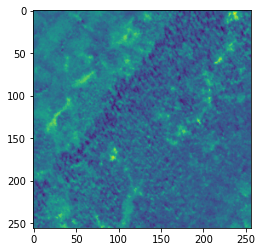

In [70]:
plt.imshow(predict_img[1000,:,:])

In [71]:
predict_img[3000,:,:]

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)

In [72]:
Y_all = model.predict(predict_img.reshape(T, N, M, 1))

95/95 [==============================] - 327s 3s/step


In [73]:
def save_predict_tree( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path_tile(orig_dir, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all[i, :, :, 0])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [74]:
tree_valid_dir = r'/media/hkropp/research/Kolyma_Data/predictions/1971_strat_k5/tree'
save_predict_tree(nImg = T,xdim= 256, ydim= 256,img_dir = tree_valid_dir,prefix = "tree_predict",orig_dir = base_dirP , prefix_orig = "img")

In [75]:
def save_predict_water( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path_tile(orig_dir, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all[i, :, :, 1])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [76]:
water_valid_dir = r'/media/hkropp/research/Kolyma_Data/predictions/1971_strat_k5/water'
save_predict_water(nImg = T,xdim= 256, ydim= 256,img_dir = water_valid_dir,prefix = "water_predict",orig_dir = base_dirP , prefix_orig = "img")

In [77]:
def save_predict_shrub( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path_tile(orig_dir, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all[i, :, :, 2])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [78]:
shrub_valid_dir = r'/media/hkropp/research/Kolyma_Data/predictions/1971_strat_k5/shrub'
save_predict_shrub(nImg = T,xdim= 256, ydim= 256,img_dir = shrub_valid_dir,prefix = "shrub_predict",orig_dir = base_dirP , prefix_orig = "img")

In [79]:
def save_predict_lowD( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path_tile(orig_dir, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all[i, :, :, 3])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [81]:
lowD_valid_dir = r'/media/hkropp/research/Kolyma_Data/predictions/1971_strat_k5/low'
save_predict_lowD(nImg = T,xdim= 256, ydim= 256,img_dir = lowD_valid_dir,prefix = "lowD_predict",orig_dir = base_dirP , prefix_orig = "img")

In [82]:
base_dirP2 = Path(r'/media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2')

tiles = os.listdir(base_dirP)

T = len(tiles)

# check for partial tiles
imgD1 = np.zeros((T,2), dtype=int)



test = load_image(r'/media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img1.tif')

for i in range(T):
    tileLoad = load_image(make_path_tile(base_dirP, "img", i + 1))
    imgD1[i,0] = tileLoad.shape[0]
    imgD1[i,1] = tileLoad.shape[1]

imgFlag = np.zeros((T), dtype=int)

for i in range(T):
    if imgD1[i,0] < 256 or imgD1[i,1] < 256:
        imgFlag[i] = 1
    else:
        imgFlag[i] = 0

imgTable = np.zeros((T,2), dtype=int)
for i in range(T):
    imgTable[i,0] = imgFlag[i]
    imgTable[i,1] = i+1

def load_stack_tiles(shape, dtype, img_dir, prefix, imgFlag):
    stack = np.zeros(shape = shape, dtype = dtype)
    for i in range(shape[0]):
        tilepath = make_path_tile(img_dir, prefix, i + 1)
        if imgFlag[i,0] == 1:
            print("nullified", tilepath)
            stack[i,:,:] = np.nan
        else:
            stack[i, :,:] = load_image(tilepath)
    return stack

In [83]:
predict_img_2 = load_stack_tiles((T, N, M), np.float32,base_dirP2, "img", imgTable)

nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img46.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img92.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img138.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img184.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img230.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img276.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img322.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img368.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img414.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img460.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img506.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img552.tif
nullified /media/h

In [84]:
Y_all2 = model.predict(predict_img_2.reshape(T, N, M, 1))

95/95 [==============================] - 298s 3s/step


In [85]:
def save_predict_tree2( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path_tile(orig_dir, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all2[i, :, :, 0])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [86]:
tree_valid_dir = r'/media/hkropp/research/Kolyma_Data/predictions/1971_strat_k5_2/tree'
save_predict_tree2(nImg = T,xdim= 256, ydim= 256,img_dir = tree_valid_dir,prefix = "tree_predict",orig_dir = base_dirP2 , prefix_orig = "img")

In [87]:
def save_predict_water2( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path_tile(orig_dir, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all2[i, :, :, 1])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [88]:
water_valid_dir = r'/media/hkropp/research/Kolyma_Data/predictions/1971_strat_k5_2/water'
save_predict_water2(nImg = T,xdim= 256, ydim= 256,img_dir = water_valid_dir,prefix = "water_predict",orig_dir = base_dirP2 , prefix_orig = "img")

In [89]:
def save_predict_shrub2( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path_tile(orig_dir, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all2[i, :, :, 2])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [90]:
shrub_valid_dir = r'/media/hkropp/research/Kolyma_Data/predictions/1971_strat_k5_2/shrub'
save_predict_shrub2(nImg = T,xdim= 256, ydim= 256,img_dir = shrub_valid_dir,prefix = "shrub_predict",orig_dir = base_dirP2 , prefix_orig = "img")

In [91]:
def save_predict_lowD2( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path_tile(orig_dir, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all2[i, :, :, 3])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [92]:
lowD_valid_dir = r'/media/hkropp/research/Kolyma_Data/predictions/1971_strat_k5_2/low'
save_predict_lowD2(nImg = T,xdim= 256, ydim= 256,img_dir = lowD_valid_dir,prefix = "lowD_predict",orig_dir = base_dirP2 , prefix_orig = "img")

In [93]:
base_dirP3 = Path(r'/media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_3')

tiles = os.listdir(base_dirP)

T = len(tiles)

# check for partial tiles
imgD1 = np.zeros((T,2), dtype=int)



test = load_image(r'/media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_3/img1.tif')

for i in range(T):
    tileLoad = load_image(make_path_tile(base_dirP, "img", i + 1))
    imgD1[i,0] = tileLoad.shape[0]
    imgD1[i,1] = tileLoad.shape[1]

imgFlag = np.zeros((T), dtype=int)

for i in range(T):
    if imgD1[i,0] < 256 or imgD1[i,1] < 256:
        imgFlag[i] = 1
    else:
        imgFlag[i] = 0

imgTable = np.zeros((T,2), dtype=int)
for i in range(T):
    imgTable[i,0] = imgFlag[i]
    imgTable[i,1] = i+1

def load_stack_tiles(shape, dtype, img_dir, prefix, imgFlag):
    stack = np.zeros(shape = shape, dtype = dtype)
    for i in range(shape[0]):
        tilepath = make_path_tile(img_dir, prefix, i + 1)
        if imgFlag[i,0] == 1:
            print("nullified", tilepath)
            stack[i,:,:] = np.nan
        else:
            stack[i, :,:] = load_image(tilepath)
    return stack

In [94]:
predict_img_3 = load_stack_tiles((T, N, M), np.float32,base_dirP2, "img", imgTable)

nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img46.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img92.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img138.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img184.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img230.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img276.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img322.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img368.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img414.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img460.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img506.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img552.tif
nullified /media/h

In [95]:
Y_all3 = model.predict(predict_img_3.reshape(T, N, M, 1))

95/95 [==============================] - 305s 3s/step


In [96]:
def save_predict_tree3( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path_tile(orig_dir, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all3[i, :, :, 0])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [97]:
tree_valid_dir = r'/media/hkropp/research/Kolyma_Data/predictions/1971_strat_k5_3/tree'
save_predict_tree3(nImg = T,xdim= 256, ydim= 256,img_dir = tree_valid_dir,prefix = "tree_predict",orig_dir = base_dirP3 , prefix_orig = "img")

In [98]:
def save_predict_water3( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path_tile(orig_dir, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all3[i, :, :, 1])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [99]:
water_valid_dir = r'/media/hkropp/research/Kolyma_Data/predictions/1971_strat_k5_3/water'
save_predict_water3(nImg = T,xdim= 256, ydim= 256,img_dir = water_valid_dir,prefix = "water_predict",orig_dir = base_dirP3 , prefix_orig = "img")

In [100]:
def save_predict_shrub3( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path_tile(orig_dir, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all3[i, :, :, 2])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [101]:
shrub_valid_dir = r'/media/hkropp/research/Kolyma_Data/predictions/1971_strat_k5_3/shrub'
save_predict_shrub3(nImg = T,xdim= 256, ydim= 256,img_dir = shrub_valid_dir,prefix = "shrub_predict",orig_dir = base_dirP3 , prefix_orig = "img")

In [102]:
def save_predict_lowD3( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path_tile(orig_dir, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all3[i, :, :, 3])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [103]:
lowD_valid_dir = r'/media/hkropp/research/Kolyma_Data/predictions/1971_strat_k5_3/low'
save_predict_lowD3(nImg = T,xdim= 256, ydim= 256,img_dir = lowD_valid_dir,prefix = "lowD_predict",orig_dir = base_dirP3 , prefix_orig = "img")